# `Industrial Machine Learning on Hadoop and Spark`
## `Seminar 09: Spark image processing. Spark NLP`

### `Maks Nakhodnov`
#### `Bremen, 2025`

What you can learn from this notebook:

* How to load images in Spark
* Pandas UDF for image processing
* Spark NLP. Data preprocessing, inference, and fine-tuning deep models

In [1]:
# %pip install pyspark==3.5.7 pyarrow spark-nlp==6.2.2 "tensorflow[and-cuda]" torch torchvision

In [4]:
import os
from typing import Iterator

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50

from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import display

import matplotlib_inline

matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

2025-11-24 21:26:19.927957: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-11-24 21:26:21.990565: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.


In [2]:
import pyspark.sql.types as T
import pyspark.sql.functions as F
from pyspark.sql.window import Window

from pyspark.sql import SparkSession
from pyspark import SparkConf, SparkContext

conf = (
    SparkConf()
        .set('spark.ui.port', '4050')
        .set('spark.driver.memory', '15g')
        .set('spark.python.worker.reuse', 'true')
        # SparkNLP configuration
        .set("spark.kryoserializer.buffer.max", "2000M")
        .set("spark.jars.packages", "com.johnsnowlabs.nlp:spark-nlp_2.12:6.2.2")
        .setMaster('local[*]')
)
sc = SparkContext(conf=conf)
spark = SparkSession(sc)

25/11/24 20:06:52 WARN Utils: Your hostname, DESKTOP-8FB26C5 resolves to a loopback address: 127.0.1.1; using 172.29.27.85 instead (on interface eth0)
25/11/24 20:06:52 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address


:: loading settings :: url = jar:file:/home/maksim64/miniconda3/envs/spark/lib/python3.11/site-packages/pyspark/jars/ivy-2.5.1.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /home/maksim64/.ivy2/cache
The jars for the packages stored in: /home/maksim64/.ivy2/jars
com.johnsnowlabs.nlp#spark-nlp_2.12 added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-d86276ed-c45f-45fc-90a0-20141e897c95;1.0
	confs: [default]
	found com.johnsnowlabs.nlp#spark-nlp_2.12;6.2.2 in central
	found com.typesafe#config;1.4.2 in central
	found org.rocksdb#rocksdbjni;6.29.5 in central
	found com.amazonaws#aws-java-sdk-s3;1.12.500 in central
	found com.amazonaws#aws-java-sdk-kms;1.12.500 in central
	found com.amazonaws#aws-java-sdk-core;1.12.500 in central
	found commons-logging#commons-logging;1.1.3 in central
	found commons-codec#commons-codec;1.15 in central
	found org.apache.httpcomponents#httpclient;4.5.13 in central
	found org.apache.httpcomponents#httpcore;4.4.13 in central
	found software.amazon.ion#ion-java;1.0.2 in central
	found joda-time#joda-time;2.8.1 in central
	found com.amazonaws#jmespath-java;1.12.500 in ce

## `Image Processing`

Let's consider a model task — image classification using a trained neural network.

It can be divided into the following parts:
1. Loading images
2. Data preprocessing. Conversion to the format required for input to the model
    * Converting binary format to an image object
    * Applying image-specific operations:
        * Converting to the required color model (usually RGB[A])
        * Cropping and scaling the image
    * Converting to tensor format
    * Feature normalization
3. Inference through the model
4. Displaying the results

Let's try to implement this pipeline using the [ImageNet](https://www.image-net.org/) dataset as an example.

For demonstration, we'll download a small part of this sample:

In [3]:
if not os.path.exists('./imagenette2-320'):
    ! wget https://s3.amazonaws.com/fast-ai-imageclas/imagenette2-320.tgz
    ! tar -xvf ./imagenette2-320.tgz

In [4]:
! ls imagenette2-320
! ls imagenette2-320/train
! ls imagenette2-320/train/n03394916 | head

noisy_imagenette.csv  train  val
n01440764  n02979186  n03028079  n03417042  n03445777
n02102040  n03000684  n03394916  n03425413  n03888257
ILSVRC2012_val_00000957.JPEG
ILSVRC2012_val_00003587.JPEG
ILSVRC2012_val_00003759.JPEG
ILSVRC2012_val_00005548.JPEG
ILSVRC2012_val_00005554.JPEG
ILSVRC2012_val_00007155.JPEG
ILSVRC2012_val_00007536.JPEG
ILSVRC2012_val_00007985.JPEG
ILSVRC2012_val_00009037.JPEG
ILSVRC2012_val_00013113.JPEG
ls: write error: Broken pipe


|  ![img](imagenette2-320/train/n01440764/ILSVRC2012_val_00007197.JPEG) |  ![img](imagenette2-320/train/n03394916/ILSVRC2012_val_00009037.JPEG)  | ![img](imagenette2-320/train/n02979186/ILSVRC2012_val_00013735.JPEG)   |
|---|---|---|

#### `Loading Images`

To load images, you need to set the data format to `image`. In this case, each row of the `DataFrame` will be a structure describing an image. During reading, compressed images are unpacked, and the data in the `DataFrame` (field `image.data`) is stored in **RAW** format (a sequence of bytes describing pixel values).

In [5]:
# Spark sometimes has issues with paths containing spaces — it's better to move the images to the directory without spaces
images_dir = "./imagenette2-320/train/*"

image_df = (
    spark
        .read
        .format("image")
        .load(images_dir)
        .filter("image.nChannels > 2 AND image.height < 1000")
        .limit(20)
        .cache()
)

In [6]:
image_df.count(), image_df.printSchema()

root
 |-- image: struct (nullable = true)
 |    |-- origin: string (nullable = true)
 |    |-- height: integer (nullable = true)
 |    |-- width: integer (nullable = true)
 |    |-- nChannels: integer (nullable = true)
 |    |-- mode: integer (nullable = true)
 |    |-- data: binary (nullable = true)



(20, None)

Access to the structure's fields is done via `.`:

In [7]:
image_df.select(
    'image.origin',
    'image.height', 'image.width',
    'image.mode', 'image.nChannels'
).show(5, truncate=False)

+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+------+-----+----+---------+
|origin                                                                                                                                                                              |height|width|mode|nChannels|
+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+------+-----+----+---------+
|file:///mnt/c/Users/nahod/Documents/CodeBlocks/MSU/Hadoop/Industrial-Machine-Learning-on-Hadoop-and-Spark/Seminars/Seminar%2009/imagenette2-320/train/n01440764/n01440764_898.JPEG  |320   |632  |16  |3        |
|file:///mnt/c/Users/nahod/Documents/CodeBlocks/MSU/Hadoop/Industrial-Machine-Learning-on-Hadoop-and-Spark/Seminars/Seminar%2009/imagenette2-320/train/n0344

In [8]:
[[path, data, h, w]] = image_df.select(
    'image.origin', 'image.data', 'image.height', 'image.width'
).take(1)
path, data[:10], h, w

('file:///mnt/c/Users/nahod/Documents/CodeBlocks/MSU/Hadoop/Industrial-Machine-Learning-on-Hadoop-and-Spark/Seminars/Seminar%2009/imagenette2-320/train/n01440764/n01440764_898.JPEG',
 bytearray(b'\x11$\x11\x00\x08\x00\x00\x0b\x00!'),
 320,
 632)

#### `Data Preprocessing`

Preprocessing data presented in binary format directly is usually not possible. Special libraries can be used to apply specific operations.

Let's display an image using the `PIL` library. To do this, we will construct the image from a byte array:

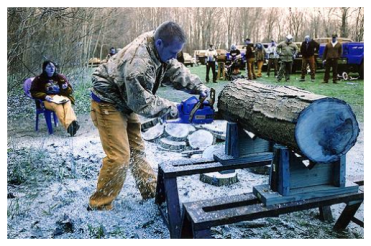

In [9]:
[image_row] = image_df.sample(1e-1, seed=1337).take(1)

color_mode = 'RGBA' if (image_row.image.nChannels == 4) else 'RGB'
image = Image.frombytes(
        mode=color_mode,
        data=bytes(image_row.image.data),
        size=[image_row.image.width, image_row.image.height]
)

plt.imshow(image)
plt.axis("off")
plt.show()

It's clear that the color scheme is incorrect. Let's apply a function that converts **BGR $\rightarrow$ RGB**:

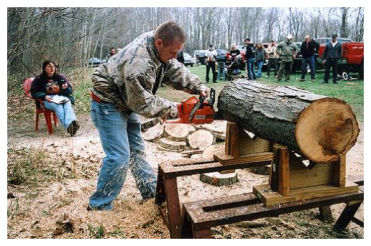

In [10]:
def convert_bgr_to_rgb(image):
    B, G, R = image.T
    return np.array((R, G, B)).T

image_rgb = convert_bgr_to_rgb(np.asarray(image))

plt.imshow(image_rgb)
plt.axis("off")
plt.show()

Further on, we want to use a trained neural network. Typically, neural networks require a fixed-size input. For example, the [ResNet50](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet50/ResNet50) network takes an image of size $224 \times 224$ as input.

Consequently, the images in the dataset need to be resized to the required dimensions:

In [11]:
def resize_image(image_row, resize=True):
    color_mode = 'RGBA' if (image_row.nChannels == 4) else 'RGB'

    image = Image.frombytes(
        mode=color_mode, data=bytes(image_row.data), size=[image_row.width, image_row.height]
    )
    image = image.convert('RGB') if (color_mode == 'RGBA') else image
    image = image.resize([224, 224], resample=Image.Resampling.BICUBIC) if resize else image
    array = convert_bgr_to_rgb(np.asarray(image)).reshape(-1)

    return array

Array shape: (150528,)


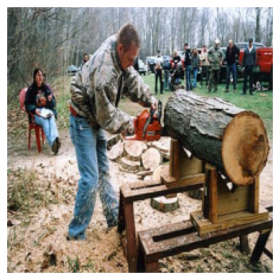

In [12]:
array = resize_image(image_row.image, resize=True)

print('Array shape: {0}'.format(array.shape))

plt.imshow(array.reshape(224, 224, 3))
plt.axis("off")
plt.show()

Now let's apply the necessary transformations to all images in the `DataFrame`. To do this, we will implement a Pandas UDF that will add the following columns to the `DataFrame`:
* `data_as_array` — an RGB image as a flat array of pixels
* `data_as_resized_array` — an RGB image of size $224 \times 224$ as a flat array of pixels

Let's consider two ways to apply a UDF.

The first option is [mapInPandas](https://spark.apache.org/docs/3.1.1/api/python/reference/api/pyspark.sql.DataFrame.mapInPandas.html), which allows processing batches of rows from the source `DataFrame` as a `pandas.DataFrame`. Using an iterator allows maintaining state when processing different batches. This is not required in this example, but during inference, this approach will allow initializing the model only once on each executor.

![img](https://bigdataschool.ru/wp-content/uploads/2024/10/spminpd_1-1.png)

| Characteristic | Python UDF (Scalar) | Python UDTF (Table) | Pandas: Series to Series | Pandas: Iterator of Series | Pandas: `mapInPandas` | Pandas: Grouped Map | Pandas: Grouped Aggregate |
| :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- |
| **Main Unit of Work** | 1 row | 1 row | 1 batch | 1 partition (processed in batches) | 1 partition (processed in batches) | 1 group | 1 group |
| **Input Data Type** | Primitive Python types | Primitive Python types | `pandas.Series` | `Iterator[pandas.Series]` | `Iterator[pandas.DataFrame]` | `pandas.DataFrame` | `pandas.Series` |
| **Output Data Type**| 1 primitive Python type | `yield` 0...N tuples | `pandas.Series` | `Iterator[pandas.Series]` | `Iterator[pandas.DataFrame]` | `pandas.DataFrame` | 1 scalar value |
| **Input/Output Size Relationship**| **1-to-1** (One input row → one output value) | **1-to-Many** (One input row → any output rows) | **N-to-N** (A Series of N items → a Series of N items) | **N-to-N** (An iterator of Series with N items → an iterator of Series with N items) | **N-to-Many** (A DF with N rows → a DF with M rows. M can be != N) | **N-to-Many** (A group DF with N rows → a DF with M rows. M can be != N) | **N-to-1** (A Series of N items → a single scalar value) |
| **Max memory usage**| 1 row | 1 row | 1 batch (up to `maxRecordsPerBatch` rows, **only required columns**) | One batch at a time from a partition (up to maxRecordsPerBatch rows, **required columns only**).	 | One batch at a time from a partition (up to maxRecordsPerBatch rows, but **ALL DataFrame columns**). | **ENTIRE group** (all rows and columns) | **ENTIRE group** (all rows, but only required columns) |
| **Number of Calls** | `N` times (where N is the number of rows) | `eval` method is called `N` times | **Depends on batch size.** Approx: `Num Partitions * (Partition Size / Batch Size)` | **Initialization: Once per partition.** Inner loop: Once per batch. | **Initialization: Once per partition.** Inner loop: Once per batch. | `K` times (where K is the number of groups) | `K` times |
| **Impact of `maxRecordsPerBatch`** | **No** | **No** | **Yes.** Increasing batch size reduces the number of calls. | **Yes.** Affects the number of *inner loop* iterations, but not the number of initializations. | **Yes.** Affects the number of *inner loop* iterations, but not the number of initializations. | **No.** A group is not split into batches. | **No.** A group is not split into batches. |
| **Vectorization (Pandas)**| No | No | **Yes** | **Yes** | **Yes** | **Yes** | **Yes** |
| **Efficient Transfer (Arrow)**| No (uses `pickle`) | No (uses `pickle`) | **Yes** | **Yes** | **Yes** | **Yes** | **Yes** |
| **Requires Shuffle?** | No | No | No | No | No | **Yes** | **Yes** |
| **OOM Risk** | Very Low | Low | Low | Low | Medium | **Very High** | High |

In [13]:
# To define a UDF, you must explicitly specify the schema of the DataFrame after the transformation
new_schema = (
    T.StructType(image_df.select("image.*").schema.fields + [
        T.StructField("data_as_array", T.ArrayType(T.IntegerType()), True),
        T.StructField("data_as_resized_array", T.ArrayType(T.IntegerType()), True)
    ])
)

def resize_image_udf(dataframe_batch_iterator: Iterator[pd.DataFrame]) -> Iterator[pd.DataFrame]:
    # We use an Iterator Pandas UDF
    for dataframe_batch in dataframe_batch_iterator:
        # Each iteration processes a batch of rows from the DataFrame, represented as a pandas.DataFrame
        dataframe_batch["data_as_array"] = (
            dataframe_batch.apply(resize_image, args=(False,), axis=1)
        )
        dataframe_batch["data_as_resized_array"] = (
            dataframe_batch.apply(resize_image, args=(True,), axis=1)
        )

        yield dataframe_batch

resized_df = image_df.select("image.*").mapInPandas(resize_image_udf, new_schema).cache()
resized_df.printSchema()

root
 |-- origin: string (nullable = true)
 |-- height: integer (nullable = true)
 |-- width: integer (nullable = true)
 |-- nChannels: integer (nullable = true)
 |-- mode: integer (nullable = true)
 |-- data: binary (nullable = true)
 |-- data_as_array: array (nullable = true)
 |    |-- element: integer (containsNull = true)
 |-- data_as_resized_array: array (nullable = true)
 |    |-- element: integer (containsNull = true)



The second option is [pandas_udf](https://spark.apache.org/docs/3.1.2/api/python/reference/api/pyspark.sql.functions.pandas_udf.html), specifically the Series-to-Series variant. In this case, the input column is also divided into batches of rows, which are sequentially passed to the user-defined function. That is, this option is conceptually equivalent to the previous one, except for the ability to maintain an internal state.

In [14]:
@F.pandas_udf(T.ArrayType(T.IntegerType()))
def image_to_array_udf(images: pd.Series) -> pd.Series:
    return images.apply(resize_image, args=(False,), axis=1)

@F.pandas_udf(T.ArrayType(T.IntegerType()))
def resized_image_to_array_udf(images: pd.Series) -> pd.Series:
    return images.apply(resize_image, args=(True,), axis=1)

resized_df = (
    image_df
        .withColumn('data_as_array', image_to_array_udf('image'))
        .withColumn('data_as_resized_array', resized_image_to_array_udf('image'))
).cache()
resized_df.printSchema()

root
 |-- image: struct (nullable = true)
 |    |-- origin: string (nullable = true)
 |    |-- height: integer (nullable = true)
 |    |-- width: integer (nullable = true)
 |    |-- nChannels: integer (nullable = true)
 |    |-- mode: integer (nullable = true)
 |    |-- data: binary (nullable = true)
 |-- data_as_array: array (nullable = true)
 |    |-- element: integer (containsNull = true)
 |-- data_as_resized_array: array (nullable = true)
 |    |-- element: integer (containsNull = true)



Let's verify the correctness of the transformations:

In [15]:
[resized_image_row] = resized_df.sample(1e-1, seed=1337).take(1)

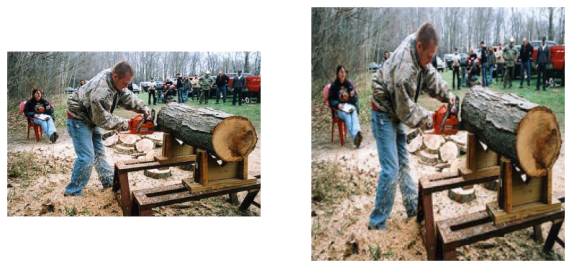

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(
    Image.frombytes(
        mode='RGB',
        data=bytes(resized_image_row.data_as_array),
        size=[resized_image_row.image.width, resized_image_row.image.height]
))
axes[1].imshow(
    Image.frombytes(
        mode='RGB',
        data=bytes(resized_image_row.data_as_resized_array),
        size=[224, 224]
))
axes[0].axis('off')
axes[1].axis('off')

plt.show()

Now, we need to convert the image into the format required by the pre-trained model. In this case, we can also use a ready-made function:

In [ ]:
def normalize_image(image_array):
    return tf.keras.applications.resnet50.preprocess_input(
        image_array.reshape([224, 224, 3])
    )

normalized_input = normalize_image(np.array(resized_image_row.data_as_resized_array))

Let's check that we have performed the transformations correctly and that the model, trained on the same dataset, gives correct results:

In [ ]:
model = ResNet50()

predictions = model.predict(normalized_input[None, ...])

decoded_predictions = tf.keras.applications.resnet50.decode_predictions(predictions, top=5)

predictions[:, :10], decoded_predictions

#### `Inference`

Let's perform predictions for all objects. Since loading the model from a checkpoint for each batch will lead to an unacceptable data processing speed, we will use the UDF syntax in an iterator format:

In [20]:
@F.pandas_udf(T.ArrayType(T.FloatType()))
def predict_batch_udf(iterator: Iterator[pd.Series]) -> Iterator[pd.Series]:
    model = ResNet50()

    for input_array in iterator:
        normalized_input = np.stack(input_array.map(normalize_image))
        predictions = model.predict(normalized_input)
        yield pd.Series(list(predictions))

predicted_df = resized_df.withColumn(
    "predictions", predict_batch_udf("data_as_resized_array")
)
predicted_df.printSchema()

root
 |-- image: struct (nullable = true)
 |    |-- origin: string (nullable = true)
 |    |-- height: integer (nullable = true)
 |    |-- width: integer (nullable = true)
 |    |-- nChannels: integer (nullable = true)
 |    |-- mode: integer (nullable = true)
 |    |-- data: binary (nullable = true)
 |-- data_as_array: array (nullable = true)
 |    |-- element: integer (containsNull = true)
 |-- data_as_resized_array: array (nullable = true)
 |    |-- element: integer (containsNull = true)
 |-- predictions: array (nullable = true)
 |    |-- element: float (containsNull = true)



**Question 1. What is the critiacal problem with the code above? Why will this code fail in the best case scenario?**

**Question 2. Let's say we have some heavy model weights on the driver, perhaps downloaded from the internet. How can we make these weights available to all workers? What's the easiest way?**

In [21]:
[prediction_row] = predicted_df.sample(1e-1, seed=1337).take(1)

2025-11-23 16:31:59.038890: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1763911923.658067   40364 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20179 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4090, pci bus id: 0000:0a:00.0, compute capability: 8.9
2025-11-23 16:32:12.277714: I external/local_xla/xla/service/service.cc:163] XLA service 0x7499fc004e70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-11-23 16:32:12.277741: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2025-11-23 16:32:12.328791: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling M

In [22]:
prediction_row.predictions[:10]

[2.4018591560093228e-09,
 2.2123071430346641e-10,
 9.162890890479503e-09,
 5.577429629255448e-10,
 1.5601139269350028e-09,
 2.2332986571171887e-09,
 7.917017041947361e-10,
 1.2353316147795113e-09,
 1.6105095035356953e-09,
 8.792370165267016e-10]

Finally, let's output the names of the top-5 predicted classes:

In [23]:
def get_top5_predictions(predictions):
    return tf.keras.applications.resnet50.decode_predictions(
        np.array(predictions).reshape(1, 1000), top=5
    )

top5_predictions = get_top5_predictions(prediction_row.predictions)
[top5] = top5_predictions

In [24]:
top5

[('n03000684', 'chain_saw', 0.94674152135849),
 ('n03697007', 'lumbermill', 0.05310462787747383),
 ('n02795169', 'barrel', 4.87425277242437e-05),
 ('n03498962', 'hatchet', 2.3072918338584714e-05),
 ('n03249569', 'drum', 1.517366854386637e-05)]

Let's add information about class labels to the DataFrame. To do this, we will add three columns to each row in the following format:

In [25]:
pd.DataFrame(
    top5, columns=["pred_id", "label", "score"]
).aggregate(lambda x: [x.tolist()], axis=0)

,pred_id,label,score
0,"[n03000684, n03697007, n02795169, n03498962, n...","[chain_saw, lumbermill, barrel, hatchet, drum]","[0.94674152135849, 0.05310462787747383, 4.8742..."


In [26]:
# Specify that three columns will be added after processing
decoded_predictions_schema = (
    T.StructType(predicted_df.select('image.*', 'data_as_resized_array', 'predictions').schema.fields + [
        T.StructField('pred_id', T.ArrayType(T.StringType()), False),
        T.StructField('label', T.ArrayType(T.StringType()), False),
        T.StructField('score', T.ArrayType(T.FloatType()), False)
]))

def top5predictions_batch_udf(iterator: Iterator[pd.DataFrame]) -> Iterator[pd.DataFrame]:
    # For each batch of rows, add the corresponding columns
    for dataframe_batch in iterator:
        # New columns for the batch
        new_columns = pd.concat([
            # New columns for one row in the batch
            pd.DataFrame(
                top5,
                columns=['pred_id', 'label', 'score']
            ).aggregate(lambda x: [x.tolist()], axis=0)
            for [top5] in dataframe_batch.predictions.map(get_top5_predictions)
        ]).reset_index(drop=True)

        # Add columns
        yield pd.merge(
            dataframe_batch, right=new_columns,
            left_index=True, right_index=True
        )

# If the Arrow data transfer format is used (which is necessary for efficient UDF operation)
#    then all nested structures must be unpacked
top5_predictions_df = predicted_df.select('image.*', 'data_as_resized_array', 'predictions').mapInPandas(
    top5predictions_batch_udf, decoded_predictions_schema
)
top5_predictions_df.printSchema()

root
 |-- origin: string (nullable = true)
 |-- height: integer (nullable = true)
 |-- width: integer (nullable = true)
 |-- nChannels: integer (nullable = true)
 |-- mode: integer (nullable = true)
 |-- data: binary (nullable = true)
 |-- data_as_resized_array: array (nullable = true)
 |    |-- element: integer (containsNull = true)
 |-- predictions: array (nullable = true)
 |    |-- element: float (containsNull = true)
 |-- pred_id: array (nullable = false)
 |    |-- element: string (containsNull = true)
 |-- label: array (nullable = false)
 |    |-- element: string (containsNull = true)
 |-- score: array (nullable = false)
 |    |-- element: float (containsNull = true)



In [27]:
[top5_prediction_row] = top5_predictions_df.sample(1e-1, seed=1337).take(1)

2025-11-23 16:32:56.771939: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1763911981.972964   40863 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 21456 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4090, pci bus id: 0000:0a:00.0, compute capability: 8.9
2025-11-23 16:33:05.233447: I external/local_xla/xla/service/service.cc:163] XLA service 0x7499fc0c5000 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-11-23 16:33:05.233477: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2025-11-23 16:33:05.287792: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling M

In [28]:
top5_prediction_row.pred_id, top5_prediction_row.label, top5_prediction_row.score

(['n03000684', 'n03697007', 'n02795169', 'n03498962', 'n03249569'],
 ['chain_saw', 'lumbermill', 'barrel', 'hatchet', 'drum'],
 [0.94674152135849,
  0.05310462787747383,
  4.87425277242437e-05,
  2.3072918338584714e-05,
  1.517366854386637e-05])

In [29]:
final_predictions = top5_predictions_df.collect()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step0 + 1) / 1]
2025-11-23 16:33:16.812687: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [30]:
final_predictions[4].pred_id, final_predictions[4].score, final_predictions[4].label

(['n04458633', 'n03697007', 'n03967562', 'n03000684', 'n02879718'],
 [0.2767263650894165,
  0.1473596841096878,
  0.12638477981090546,
  0.09276892989873886,
  0.040765535086393356],
 ['totem_pole', 'lumbermill', 'plow', 'chain_saw', 'bow'])

Let's visualize the results:

In [31]:
fig, axes = plt.subplots(len(final_predictions) // 4, 4, figsize=(2.5 * 4, 2.5 * len(final_predictions) // 4))

for ax, row in zip(axes.reshape(-1), final_predictions):
    image = Image.frombytes(
        mode='RGB',
        data=bytes(row.data_as_resized_array),
        size=[224,224]
    )
    ax.imshow(image)
    ax.axis("off")
    ax.set_title(row.label[0])

fig.tight_layout()
plt.show()

## `Text Processing. Spark NLP`

In [28]:
import sparknlp

from pyspark.ml import Pipeline
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

Now let's consider another popular domain — text.

For working with text, you can use Spark ML, however, the set of tools is limited. In particular, there are no pre-trained models, including neural networks.

**Spark NLP** supports a large number of transformers and estimators for working with text, including pre-trained neural networks.

The text processing pipeline can look like this:
1. Loading data into a Spark DataFrame
2. Conversion to the data type required for **Spark NLP** (Document)
3. Transformations using **Spark NLP** (tokenization, stemming, embeddings, model inference)
4. Conversion back to "regular" data types
5. Applying Spark ML

Among the advantages, we can note the high efficiency of inference in the presence of a large number of executors.

Thus, with the correct configuration, Spark NLP can be 5 times faster than a GPU:

```text
https://github.com/JohnSnowLabs/spark-nlp/issues/570

For BertEmbeddings:
On a local server with 50 cores and 180G memory:
1. 14k sentences take more than 16000 seconds on CPU (27 minutes)
2. 14K sentences take around 500 seconds on Tesla P100 GPU (less than 10)
3. 17K sentences take around 120 seconds on a CPU-based Spark cluster with 10 executors each 5 cores!
This has been tested on a Bert Model with 256 max sentence length and second-to-last-hidden layer which is way slower due to encoding from sentence's context.

Two things are very important, first is that Bert is GPU optimized not CPU. The second is, we distribute TensorFlow over Spark so this boost parallelism into prediction which as you can see it beats a single GPU. (now if you have GPU Spark cluster then this would be flying)
```

Among the disadvantages, it can be noted that model training occurs only on the driver:
```text
https://github.com/JohnSnowLabs/spark-nlp/issues/9266

* Unfortunately, at the moment the trainable annotators can only use Driver and cannot scale (CPU or GPU).
* Training in Spark NLP happens inside Driver and only on 1 GPU
* Prediction/inference also uses 1 GPU device, however, if you are in a cluster mode (multiple executors) then each machine can have 1 GPU device and that way you can distribute and parallelize the computation over multiple GPU
* Currently, due to TensorFlow limitations especially available APIs in Java only 1 GPU per machine is possible
```

### `Applying an existing Pipeline`

Models can be inferred for single examples:

In [17]:
from sparknlp.pretrained import PretrainedPipeline

explain_document_pipeline = PretrainedPipeline("explain_document_ml")
annotations = explain_document_pipeline.annotate("We are very happy about SparkNLP")
annotations

explain_document_ml download started this may take some time.
Approx size to download 9 MB
[ | ]

25/11/24 20:12:04 WARN S3AbortableInputStream: Not all bytes were read from the S3ObjectInputStream, aborting HTTP connection. This is likely an error and may result in sub-optimal behavior. Request only the bytes you need via a ranged GET or drain the input stream after use.
25/11/24 20:12:04 WARN S3AbortableInputStream: Not all bytes were read from the S3ObjectInputStream, aborting HTTP connection. This is likely an error and may result in sub-optimal behavior. Request only the bytes you need via a ranged GET or drain the input stream after use.


explain_document_ml download started this may take some time.
Approximate size to download 9 MB
Download done! Loading the resource.
[OK!]


{'document': ['We are very happy about SparkNLP'],
 'spell': ['We', 'are', 'very', 'happy', 'about', 'SparkNLP'],
 'pos': ['PRP', 'VBP', 'RB', 'JJ', 'IN', 'NNP'],
 'lemmas': ['We', 'be', 'very', 'happy', 'about', 'SparkNLP'],
 'token': ['We', 'are', 'very', 'happy', 'about', 'SparkNLP'],
 'stems': ['we', 'ar', 'veri', 'happi', 'about', 'sparknlp'],
 'sentence': ['We are very happy about SparkNLP']}

As well as for distributed data:

In [18]:
sample_df = spark.createDataFrame([
       ("We are very happy about SparkNLP", )
], ['text'])
sample_df.show()

+--------------------+
|                text|
+--------------------+
|We are very happy...|
+--------------------+



In [19]:
explain_document_pipeline.transform(sample_df).toPandas()

25/11/24 20:13:00 WARN DAGScheduler: Broadcasting large task binary with size 6.1 MiB


,text,document,sentence,token,spell,lemmas,stems,pos
0,We are very happy about SparkNLP,"[(document, 0, 31, We are very happy about Spa...","[(document, 0, 31, We are very happy about Spa...","[(token, 0, 1, We, {'sentence': '0'}, []), (to...","[(token, 0, 1, We, {'sentence': '0', 'confiden...","[(token, 0, 1, We, {'sentence': '0', 'confiden...","[(token, 0, 1, we, {'sentence': '0', 'confiden...","[(pos, 0, 1, PRP, {'sentence': '0', 'word': 'W..."


The library uses a set of concepts from Spark ML:
* **Annotator Approaches** — `Spark ML Estimator`, i.e., a model that can be trained
* **Annotator Models** — `Spark ML Transformer`, i.e., a trained model that allows adding columns to a DataFrame

In [20]:
explain_document_pipeline.model.stages

[document_811d40a38b24,
 SENTENCE_ce56851acebe,
 REGEX_TOKENIZER_e3f6c1c7744c,
 SPELL_79c88338ef12,
 LEMMATIZER_c62ad8f355f9,
 STEMMER_caf11d1f4d0e,
 POS_dbb704204f6f]

Spark NLP works with columns in a special format — the **annotated text format**. This type is defined as a list of **annotations**, each corresponding to a certain substring of the original text (fields `begin`, `end`) and contains information about the type of this segment (`annotatorType`), as well as the annotations themselves (`result`, `metadata`) and meta-information (`metadata`).

In [21]:
sentences = [
  ['Hello, this is an example sentence'],
  ['And this is a second sentence.']
]

data = spark.createDataFrame(sentences).toDF("text")
explained_df = explain_document_pipeline.transform(data)
explained_df.printSchema()

root
 |-- text: string (nullable = true)
 |-- document: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- annotatorType: string (nullable = true)
 |    |    |-- begin: integer (nullable = false)
 |    |    |-- end: integer (nullable = false)
 |    |    |-- result: string (nullable = true)
 |    |    |-- metadata: map (nullable = true)
 |    |    |    |-- key: string
 |    |    |    |-- value: string (valueContainsNull = true)
 |    |    |-- embeddings: array (nullable = true)
 |    |    |    |-- element: float (containsNull = false)
 |-- sentence: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- annotatorType: string (nullable = true)
 |    |    |-- begin: integer (nullable = false)
 |    |    |-- end: integer (nullable = false)
 |    |    |-- result: string (nullable = true)
 |    |    |-- metadata: map (nullable = true)
 |    |    |    |-- key: string
 |    |    |    |-- value: string (valueContainsNull = true

Let's look at examples of such annotated columns.

The first step in working with Spark NLP is to convert RAW text into a document.

It is clear that the document consists of one annotation:

In [22]:
[document] = explained_df.select('document').take(1)
document

Row(document=[Row(annotatorType='document', begin=0, end=33, result='Hello, this is an example sentence', metadata={'sentence': '0'}, embeddings=[])])

Applying other models transforms one column with annotations into another:

In [23]:
[tokens] = explained_df.select('token').take(1)
[pos_tags] = explained_df.select('pos').take(1)

25/11/24 20:16:23 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:16:24 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:16:25 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB


For example, tokenization will turn a document into a list of tokens:

In [24]:
tokens.token

[Row(annotatorType='token', begin=0, end=4, result='Hello', metadata={'sentence': '0'}, embeddings=[]),
 Row(annotatorType='token', begin=5, end=5, result=',', metadata={'sentence': '0'}, embeddings=[]),
 Row(annotatorType='token', begin=7, end=10, result='this', metadata={'sentence': '0'}, embeddings=[]),
 Row(annotatorType='token', begin=12, end=13, result='is', metadata={'sentence': '0'}, embeddings=[]),
 Row(annotatorType='token', begin=15, end=16, result='an', metadata={'sentence': '0'}, embeddings=[]),
 Row(annotatorType='token', begin=18, end=24, result='example', metadata={'sentence': '0'}, embeddings=[]),
 Row(annotatorType='token', begin=26, end=33, result='sentence', metadata={'sentence': '0'}, embeddings=[])]

Then, by applying a POS-tagger, we get a list of part-of-speech annotations for the list of tokens:

In [25]:
pos_tags.pos

[Row(annotatorType='pos', begin=0, end=4, result='UH', metadata={'sentence': '0', 'word': 'Hello'}, embeddings=[]),
 Row(annotatorType='pos', begin=5, end=5, result=',', metadata={'sentence': '0', 'word': ','}, embeddings=[]),
 Row(annotatorType='pos', begin=7, end=10, result='DT', metadata={'sentence': '0', 'word': 'this'}, embeddings=[]),
 Row(annotatorType='pos', begin=12, end=13, result='VBZ', metadata={'sentence': '0', 'word': 'is'}, embeddings=[]),
 Row(annotatorType='pos', begin=15, end=16, result='DT', metadata={'sentence': '0', 'word': 'an'}, embeddings=[]),
 Row(annotatorType='pos', begin=18, end=24, result='NN', metadata={'sentence': '0', 'word': 'example'}, embeddings=[]),
 Row(annotatorType='pos', begin=26, end=33, result='NN', metadata={'sentence': '0', 'word': 'sentence'}, embeddings=[])]

In [26]:
with pd.option_context('display.max_colwidth', None):
    display(explained_df.select('document').limit(5).toPandas())
    display(explained_df.select('sentence').limit(5).toPandas())
    display(explained_df.select('token').limit(5).toPandas())
    display(explained_df.select('spell').limit(5).toPandas())
    display(explained_df.select('lemmas').limit(5).toPandas())
    display(explained_df.select('stems').limit(5).toPandas())
    display(explained_df.select('pos').limit(5).toPandas())

,document
0,"[(document, 0, 33, Hello, this is an example sentence, {'sentence': '0'}, [])]"
1,"[(document, 0, 29, And this is a second sentence., {'sentence': '0'}, [])]"


,sentence
0,"[(document, 0, 33, Hello, this is an example sentence, {'sentence': '0'}, [])]"
1,"[(document, 0, 29, And this is a second sentence., {'sentence': '0'}, [])]"


,token
0,"[(token, 0, 4, Hello, {'sentence': '0'}, []), (token, 5, 5, ,, {'sentence': '0'}, []), (token, 7, 10, this, {'sentence': '0'}, []), (token, 12, 13, is, {'sentence': '0'}, []), (token, 15, 16, an, {'sentence': '0'}, []), (token, 18, 24, example, {'sentence': '0'}, []), (token, 26, 33, sentence, {'sentence': '0'}, [])]"
1,"[(token, 0, 2, And, {'sentence': '0'}, []), (token, 4, 7, this, {'sentence': '0'}, []), (token, 9, 10, is, {'sentence': '0'}, []), (token, 12, 12, a, {'sentence': '0'}, []), (token, 14, 19, second, {'sentence': '0'}, []), (token, 21, 28, sentence, {'sentence': '0'}, []), (token, 29, 29, ., {'sentence': '0'}, [])]"


25/11/24 20:16:59 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:17:00 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:17:01 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB


,spell
0,"[(token, 0, 4, Hello, {'sentence': '0', 'confidence': '1.0'}, []), (token, 5, 5, ,, {'sentence': '0', 'confidence': '0.0'}, []), (token, 7, 10, this, {'sentence': '0', 'confidence': '1.0'}, []), (token, 12, 13, is, {'sentence': '0', 'confidence': '1.0'}, []), (token, 15, 16, an, {'sentence': '0', 'confidence': '1.0'}, []), (token, 18, 24, example, {'sentence': '0', 'confidence': '1.0'}, []), (token, 26, 33, sentence, {'sentence': '0', 'confidence': '1.0'}, [])]"
1,"[(token, 0, 2, And, {'sentence': '0', 'confidence': '1.0'}, []), (token, 4, 7, this, {'sentence': '0', 'confidence': '1.0'}, []), (token, 9, 10, is, {'sentence': '0', 'confidence': '1.0'}, []), (token, 12, 12, a, {'sentence': '0', 'confidence': '1.0'}, []), (token, 14, 19, second, {'sentence': '0', 'confidence': '1.0'}, []), (token, 21, 28, sentence, {'sentence': '0', 'confidence': '1.0'}, []), (token, 29, 29, ., {'sentence': '0', 'confidence': '0.0'}, [])]"


25/11/24 20:17:03 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:17:03 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:17:04 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB


,lemmas
0,"[(token, 0, 4, Hello, {'sentence': '0', 'confidence': '1.0'}, []), (token, 5, 5, ,, {'sentence': '0', 'confidence': '0.0'}, []), (token, 7, 10, this, {'sentence': '0', 'confidence': '1.0'}, []), (token, 12, 13, be, {'sentence': '0', 'confidence': '1.0'}, []), (token, 15, 16, an, {'sentence': '0', 'confidence': '1.0'}, []), (token, 18, 24, example, {'sentence': '0', 'confidence': '1.0'}, []), (token, 26, 33, sentence, {'sentence': '0', 'confidence': '1.0'}, [])]"
1,"[(token, 0, 2, And, {'sentence': '0', 'confidence': '1.0'}, []), (token, 4, 7, this, {'sentence': '0', 'confidence': '1.0'}, []), (token, 9, 10, be, {'sentence': '0', 'confidence': '1.0'}, []), (token, 12, 12, a, {'sentence': '0', 'confidence': '1.0'}, []), (token, 14, 19, second, {'sentence': '0', 'confidence': '1.0'}, []), (token, 21, 28, sentence, {'sentence': '0', 'confidence': '1.0'}, []), (token, 29, 29, ., {'sentence': '0', 'confidence': '0.0'}, [])]"


25/11/24 20:17:05 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:17:06 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:17:07 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB


,stems
0,"[(token, 0, 4, hello, {'sentence': '0', 'confidence': '1.0'}, []), (token, 5, 5, ,, {'sentence': '0', 'confidence': '0.0'}, []), (token, 7, 10, thi, {'sentence': '0', 'confidence': '1.0'}, []), (token, 12, 13, i, {'sentence': '0', 'confidence': '1.0'}, []), (token, 15, 16, an, {'sentence': '0', 'confidence': '1.0'}, []), (token, 18, 24, exampl, {'sentence': '0', 'confidence': '1.0'}, []), (token, 26, 33, sentenc, {'sentence': '0', 'confidence': '1.0'}, [])]"
1,"[(token, 0, 2, and, {'sentence': '0', 'confidence': '1.0'}, []), (token, 4, 7, thi, {'sentence': '0', 'confidence': '1.0'}, []), (token, 9, 10, i, {'sentence': '0', 'confidence': '1.0'}, []), (token, 12, 12, a, {'sentence': '0', 'confidence': '1.0'}, []), (token, 14, 19, second, {'sentence': '0', 'confidence': '1.0'}, []), (token, 21, 28, sentenc, {'sentence': '0', 'confidence': '1.0'}, []), (token, 29, 29, ., {'sentence': '0', 'confidence': '0.0'}, [])]"


25/11/24 20:17:09 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:17:09 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:17:10 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB


,pos
0,"[(pos, 0, 4, UH, {'sentence': '0', 'word': 'Hello'}, []), (pos, 5, 5, ,, {'sentence': '0', 'word': ','}, []), (pos, 7, 10, DT, {'sentence': '0', 'word': 'this'}, []), (pos, 12, 13, VBZ, {'sentence': '0', 'word': 'is'}, []), (pos, 15, 16, DT, {'sentence': '0', 'word': 'an'}, []), (pos, 18, 24, NN, {'sentence': '0', 'word': 'example'}, []), (pos, 26, 33, NN, {'sentence': '0', 'word': 'sentence'}, [])]"
1,"[(pos, 0, 2, CC, {'sentence': '0', 'word': 'And'}, []), (pos, 4, 7, DT, {'sentence': '0', 'word': 'this'}, []), (pos, 9, 10, VBZ, {'sentence': '0', 'word': 'is'}, []), (pos, 12, 12, DT, {'sentence': '0', 'word': 'a'}, []), (pos, 14, 19, JJ, {'sentence': '0', 'word': 'second'}, []), (pos, 21, 28, NN, {'sentence': '0', 'word': 'sentence'}, []), (pos, 29, 29, ., {'sentence': '0', 'word': '.'}, [])]"


Displaying columns as annotations makes data analysis difficult. For convenient reading of the content, the `sparknlp.Finisher` Transformer is used, which leaves only the `result` field from each annotation and returns them as a list:

In [29]:
finisher = sparknlp.Finisher().setInputCols(["token", "lemmas", "pos"])

pipeline = (
    Pipeline()
        .setStages([
            explain_document_pipeline.model,
            finisher
        ])
)

model = pipeline.fit(data)

annotations_finished_df = model.transform(data)

with pd.option_context('display.max_colwidth', None):
    display(annotations_finished_df.select('text').limit(5).toPandas())
    display(annotations_finished_df.select('finished_pos').limit(5).toPandas())
    display(annotations_finished_df.select('finished_token').limit(5).toPandas())
    display(annotations_finished_df.select('finished_lemmas').limit(5).toPandas())

,text
0,"Hello, this is an example sentence"
1,And this is a second sentence.


25/11/24 20:18:11 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:18:12 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:18:13 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB


,finished_pos
0,"[UH, ,, DT, VBZ, DT, NN, NN]"
1,"[CC, DT, VBZ, DT, JJ, NN, .]"


,finished_token
0,"[Hello, ,, this, is, an, example, sentence]"
1,"[And, this, is, a, second, sentence, .]"


25/11/24 20:18:15 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:18:16 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB
25/11/24 20:18:16 WARN DAGScheduler: Broadcasting large task binary with size 6.0 MiB


,finished_lemmas
0,"[Hello, ,, this, be, an, example, sentence]"
1,"[And, this, be, a, second, sentence, .]"


### `Fine-tuning the Classifier`

Let's use Spark NLP for fine-tuning on a multi-class classification task — we will predict the news category:

In [33]:
base_url = 'https://s3.amazonaws.com/auxdata.johnsnowlabs.com/public/resources/en/classifier-dl/news_Category'
! wget -O news_category_test.csv $base_url/news_category_test.csv
! wget -O news_category_train.csv $base_url/news_category_train.csv

--2025-11-24 20:23:24--  https://s3.amazonaws.com/auxdata.johnsnowlabs.com/public/resources/en/classifier-dl/news_Category/news_category_test.csv
Resolving s3.amazonaws.com (s3.amazonaws.com)... 16.15.189.117, 16.182.38.64, 52.216.52.192, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|16.15.189.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1504408 (1.4M) [text/csv]
Saving to: ‘news_category_test.csv’

news_category_test. 100%[===================>]   1.43M  2.28MB/s    in 0.6s    

2025-11-24 20:23:25 (2.28 MB/s) - ‘news_category_test.csv’ saved [1504408/1504408]

--2025-11-24 20:23:26--  https://s3.amazonaws.com/auxdata.johnsnowlabs.com/public/resources/en/classifier-dl/news_Category/news_category_train.csv
Resolving s3.amazonaws.com (s3.amazonaws.com)... 16.15.189.117, 16.182.38.64, 52.216.52.192, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|16.15.189.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24032125 

In [34]:
! head news_category_train.csv

category,description
Business," Short sellers, Wall Street's dwindling band of ultra cynics, are seeing green again."
Business," Private investment firm Carlyle Group, which has a reputation for making well timed and occasionally controversial plays in the defense industry, has quietly placed its bets on another part of the market."
Business, Soaring crude prices plus worries about the economy and the outlook for earnings are expected to hang over the stock market next week during the depth of the summer doldrums.
Business," Authorities have halted oil export flows from the main pipeline in southern Iraq after intelligence showed a rebel militia could strike infrastructure, an oil official said on Saturday."
Business," Tearaway world oil prices, toppling records and straining wallets, present a new economic menace barely three months before the US presidential elections."
Business," Stocks ended slightly higher on Friday but stayed near lows for the year as oil prices surged past  #36;

In [35]:
train_df = (
    spark.read
      .option("header", True)
      .csv("news_category_train.csv")
)
test_df = (
    spark.read
      .option("header", True)
      .csv("news_category_test.csv")
)

display(train_df.limit(5).toPandas())
display(test_df.limit(5).toPandas())

train_df.count(), test_df.count()

,category,description
0,Business,"Short sellers, Wall Street's dwindling band o..."
1,Business,"Private investment firm Carlyle Group, which ..."
2,Business,Soaring crude prices plus worries about the e...
3,Business,Authorities have halted oil export flows from...
4,Business,"Tearaway world oil prices, toppling records a..."


,category,description
0,Business,Unions representing workers at Turner Newall...
1,Sci/Tech,"TORONTO, Canada A second team of rocketeer..."
2,Sci/Tech,A company founded by a chemistry researcher a...
3,Sci/Tech,It's barely dawn when Mike Fitzpatrick starts...
4,Sci/Tech,Southern California's smog fighting agency we...


(120000, 7600)

Let's create a pipeline:
1. Converting **RAW** text to annotated format (document)
2. Calculating sentence embeddings
3. Fine-tuning the classifier

In [36]:
document = (
    sparknlp.base.DocumentAssembler()
        .setInputCol("description")
        .setOutputCol("document")
)

use = (
    sparknlp.annotator.UniversalSentenceEncoder.pretrained()
     .setInputCols(["document"])
     .setOutputCol("sentence_embeddings")
)

classsifierdl = (
    sparknlp.annotator.ClassifierDLApproach()
      .setInputCols(["sentence_embeddings"])
      .setOutputCol("class")
      .setLabelColumn("category")
      .setMaxEpochs(5)
      .setEnableOutputLogs(True)
)

dl_pipeline = Pipeline(stages=[
    document,
    use,
    classsifierdl
])

tfhub_use download started this may take some time.


25/11/24 20:25:59 WARN S3AbortableInputStream: Not all bytes were read from the S3ObjectInputStream, aborting HTTP connection. This is likely an error and may result in sub-optimal behavior. Request only the bytes you need via a ranged GET or drain the input stream after use.


Approximate size to download 923.7 MB
[ | ]

25/11/24 20:25:59 WARN S3AbortableInputStream: Not all bytes were read from the S3ObjectInputStream, aborting HTTP connection. This is likely an error and may result in sub-optimal behavior. Request only the bytes you need via a ranged GET or drain the input stream after use.
25/11/24 20:26:00 WARN S3AbortableInputStream: Not all bytes were read from the S3ObjectInputStream, aborting HTTP connection. This is likely an error and may result in sub-optimal behavior. Request only the bytes you need via a ranged GET or drain the input stream after use.


tfhub_use download started this may take some time.
Approximate size to download 923.7 MB
Download done! Loading the resource.
[ | ]

2025-11-24 20:26:10.937010: I external/org_tensorflow/tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


[OK!]


In [37]:
dl_pipeline_model = dl_pipeline.fit(train_df)

2025-11-24 20:27:17.836416: I external/org_tensorflow/tensorflow/cc/saved_model/reader.cc:43] Reading SavedModel from: /tmp/948ff63ea500_classifier_dl718214655498722501
2025-11-24 20:27:17.864954: I external/org_tensorflow/tensorflow/cc/saved_model/reader.cc:107] Reading meta graph with tags { serve }
2025-11-24 20:27:17.865033: I external/org_tensorflow/tensorflow/cc/saved_model/reader.cc:148] Reading SavedModel debug info (if present) from: /tmp/948ff63ea500_classifier_dl718214655498722501
2025-11-24 20:27:18.250401: I external/org_tensorflow/tensorflow/cc/saved_model/loader.cc:228] Restoring SavedModel bundle.
2025-11-24 20:27:18.839935: I external/org_tensorflow/tensorflow/cc/saved_model/loader.cc:212] Running initialization op on SavedModel bundle at path: /tmp/948ff63ea500_classifier_dl718214655498722501
2025-11-24 20:27:18.980263: I external/org_tensorflow/tensorflow/cc/saved_model/loader.cc:301] SavedModel load for tags { serve }; Status: success: OK. Took 1143852 microseconds.

Training started - epochs: 5 - learning_rate: 0.005 - batch_size: 64 - training_examples: 120000 - classes: 4
Epoch 1/5 - 10.80s - loss: 1614.3455 - acc: 0.8800333 - batches: 1875
Epoch 2/5 - 9.76s - loss: 1593.0703 - acc: 0.8910417 - batches: 1875
Epoch 3/5 - 9.52s - loss: 1585.2977 - acc: 0.89558333 - batches: 1875
Epoch 4/5 - 9.35s - loss: 1581.0333 - acc: 0.899175 - batches: 1875
Epoch 5/5 - 9.70s - loss: 1575.0311 - acc: 0.9026833 - batches: 1875


Trained models can be saved and loaded:

In [38]:
dl_pipeline_model.stages[-1].write().overwrite().save('./tmp_classifierDL_model')

In [39]:
classsifierdl_loaded = (
    sparknlp.annotator.ClassifierDLModel.load("./tmp_classifierDL_model")
      .setInputCols(["sentence_embeddings"])
      .setOutputCol("class")
)

dl_pipeline_eval = Pipeline(stages=[
    document,
    use,
    classsifierdl_loaded
])

Let's apply the resulting model to the test data:

In [41]:
test_df_sample = spark.createDataFrame([
    "Unions representing workers at Turner   Newall say they are 'disappointed' after talks with stricken parent firm Federal Mogul.",
    "Scientists have discovered irregular lumps beneath the icy surface of Jupiter's largest moon, Ganymede. These irregular masses may be rock formations, supported by Ganymede's icy shell for btest_dfions of years..."
], T.StringType()).toDF("description")

prediction = dl_pipeline_eval.fit(test_df_sample).transform(test_df_sample)

prediction.printSchema()
prediction.select('class.result').show()
prediction.select('class.metadata').show(truncate=False)

root
 |-- description: string (nullable = true)
 |-- document: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- annotatorType: string (nullable = true)
 |    |    |-- begin: integer (nullable = false)
 |    |    |-- end: integer (nullable = false)
 |    |    |-- result: string (nullable = true)
 |    |    |-- metadata: map (nullable = true)
 |    |    |    |-- key: string
 |    |    |    |-- value: string (valueContainsNull = true)
 |    |    |-- embeddings: array (nullable = true)
 |    |    |    |-- element: float (containsNull = false)
 |-- sentence_embeddings: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- annotatorType: string (nullable = true)
 |    |    |-- begin: integer (nullable = false)
 |    |    |-- end: integer (nullable = false)
 |    |    |-- result: string (nullable = true)
 |    |    |-- metadata: map (nullable = true)
 |    |    |    |-- key: string
 |    |    |    |-- value: string (valueC

In [42]:
predictions = dl_pipeline_eval.fit(test_df).transform(test_df)
predictions.select('category', 'description', 'class.result').sample(0.01).show(10, truncate=50)

+--------+--------------------------------------------------+----------+
|category|                                       description|    result|
+--------+--------------------------------------------------+----------+
|  Sports|Jay Haas joined Stewart Cink as the two captain...|  [Sports]|
|  Sports|Every ounce of his energy was expended, leaving...|  [Sports]|
|Sci/Tech|The producer of ads featuring PC users who swit...|[Sci/Tech]|
|   World| Republicans endorsed an uncompromising positio...|   [World]|
|Business| The U.S. economy slowed more sharply  in the s...|[Business]|
|Sci/Tech| Defects in Siemens 65 series mobile phones cou...|[Sci/Tech]|
|Sci/Tech| Like Network Appliance, many top tech firms ar...|[Sci/Tech]|
|Business|The Supreme Court is considering whether Michig...|[Business]|
|  Sports|  Baseball commissioner Bud Selig said in meeti...|  [Sports]|
|  Sports|Bobby Madritsch pitched eight shutout innings a...|  [Sports]|
+--------+-----------------------------------------

### `Quality Assessment`

Let's evaluate the quality of the resulting model by calculating Accuracy.

This can be done in two ways:
1. Calculate Accuracy manually
2. Use `MulticlassClassificationEvaluator`

We will do it using both methods.

For convenience, we'll keep only the necessary columns. Also, let's transform the prediction column. `class.result` is a list with one element. `F.explode` allows unpacking it. Alternatively, you can use `F.element_at(F.col('class.result'), 1)`:

In [65]:
predictions = predictions.select('category', 'description', F.explode('class.result').alias('prediction'))
predictions.show(10)

+--------+--------------------+----------+
|category|         description|prediction|
+--------+--------------------+----------+
|Business|Unions representi...|  Business|
|Sci/Tech| TORONTO, Canada ...|  Sci/Tech|
|Sci/Tech| A company founde...|  Sci/Tech|
|Sci/Tech| It's barely dawn...|  Sci/Tech|
|Sci/Tech| Southern Califor...|  Sci/Tech|
|Sci/Tech|"The British Depa...|     World|
|Sci/Tech|"confessed author...|  Sci/Tech|
|Sci/Tech|\\FOAF/LOAF  and ...|  Sci/Tech|
|Sci/Tech|"Wiltshire Police...|  Sci/Tech|
|Sci/Tech|In its first two ...|  Sci/Tech|
+--------+--------------------+----------+
only showing top 10 rows



#### `1`

In [66]:
(
    predictions
        .select(F.mean(
            # For aggregation by averaging, it's necessary to convert to a floating-point type
            (F.col('category') == F.col('prediction')).cast(T.FloatType())
        ).alias('accuracy'))
).show()

+------------------+
|          accuracy|
+------------------+
|0.8919736842105264|
+------------------+



#### `2`

`MulticlassClassificationEvaluator` requires columns of a floating-point type, so we need to first encode the category names into indices. One way to do this is to `join` with a table that stores this mapping.

Such a table can be created in many ways. Here are a few of them:

In [67]:
# A complex but useful option when there are many classes and deterministic encoding is needed (through sorting)
# To do this, first, the categories are made unique, then a mapping is established by numbering from 1
wspec = Window().partitionBy().orderBy('category')
label_to_idx = (
    train_df
        .select('category')
        .distinct()
        .select(F.col('category').alias('label'), F.row_number().over(wspec).alias('idx'))
)
label_to_idx.show()

25/11/24 20:43:04 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
25/11/24 20:43:04 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
25/11/24 20:43:04 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.


+--------+---+
|   label|idx|
+--------+---+
|Business|  1|
|Sci/Tech|  2|
|  Sports|  3|
|   World|  4|
+--------+---+



25/11/24 20:43:04 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
25/11/24 20:43:04 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
25/11/24 20:43:04 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.


In [68]:
# A bit simpler, but non-deterministic
label_to_idx = (
    train_df
        .select('category')
        .distinct()
        .select(F.col('category').alias('label'), F.monotonically_increasing_id().alias('idx'))
)
label_to_idx.show()

# The result will depend on how many partitions the given RDD is split into
label_to_idx = (
    train_df
        .select('category')
        .distinct()
        .repartition(2)
        .select(F.col('category').alias('label'), F.monotonically_increasing_id().alias('idx'))
)
label_to_idx.show()

+--------+---+
|   label|idx|
+--------+---+
|   World|  0|
|Sci/Tech|  1|
|  Sports|  2|
|Business|  3|
+--------+---+

+--------+----------+
|   label|       idx|
+--------+----------+
|   World|         0|
|Business|         1|
|Sci/Tech|8589934592|
|  Sports|8589934593|
+--------+----------+



In [69]:
# The simplest option is to encode the numbers manually,
#   however, there is a chance of making a mistake, especially if Unicode strings are used
label_to_idx = spark.createDataFrame([
    ('Business', 1),
    ('Sci/Tech', 2),
    ('Sports',   3),
    ('World',   4),
], ['label', 'idx'])
label_to_idx.show()

+--------+---+
|   label|idx|
+--------+---+
|Business|  1|
|Sci/Tech|  2|
|  Sports|  3|
|   World|  4|
+--------+---+



Since `label_to_idx` is small, it is advisable to use a broadcast join:

In [70]:
predictions_with_idx = (
    predictions
        .join(
            F.broadcast(label_to_idx).withColumnRenamed('idx', 'category_idx'),
            on=predictions.category == label_to_idx.label
        )
        .drop('label')
        .join(
            F.broadcast(label_to_idx).withColumnRenamed('idx', 'prediction_idx'),
            on=F.col('prediction') == label_to_idx.label
        )
        .drop('label')
)
predictions_with_idx.show(10)

+--------+--------------------+----------+------------+--------------+
|category|         description|prediction|category_idx|prediction_idx|
+--------+--------------------+----------+------------+--------------+
|Business|Unions representi...|  Business|           1|             1|
|Sci/Tech| TORONTO, Canada ...|  Sci/Tech|           2|             2|
|Sci/Tech| A company founde...|  Sci/Tech|           2|             2|
|Sci/Tech| It's barely dawn...|  Sci/Tech|           2|             2|
|Sci/Tech| Southern Califor...|  Sci/Tech|           2|             2|
|Sci/Tech|"The British Depa...|     World|           2|             4|
|Sci/Tech|"confessed author...|  Sci/Tech|           2|             2|
|Sci/Tech|\\FOAF/LOAF  and ...|  Sci/Tech|           2|             2|
|Sci/Tech|"Wiltshire Police...|  Sci/Tech|           2|             2|
|Sci/Tech|In its first two ...|  Sci/Tech|           2|             2|
+--------+--------------------+----------+------------+--------------+
only s

In [71]:
evaluator = MulticlassClassificationEvaluator(
    predictionCol='prediction_idx', labelCol='category_idx', metricName='accuracy'
)
evaluator.evaluate((
    predictions_with_idx
        .select(
            F.col('category_idx').cast(T.DoubleType()),
            F.col('prediction_idx').cast(T.DoubleType())
        )
))

0.8919736842105264

Another option for encoding strings, which is more stylistically appropriate when working with pipelines: `StringIndexer`.

In [72]:
from pyspark.ml.feature import StringIndexer

indexer = StringIndexer(inputCol='label', outputCol='idx')
indexer_model = indexer.fit(train_df.withColumnRenamed('category', 'label'))

predictions_with_idx = indexer_model.transform(
    predictions.withColumnRenamed('category', 'label')
).withColumnRenamed('idx', 'category_idx').withColumnRenamed('label', 'category')

predictions_with_idx = indexer_model.transform(
    predictions_with_idx.withColumnRenamed('prediction', 'label')
).withColumnRenamed('idx', 'prediction_idx').withColumnRenamed('label', 'prediction')
predictions_with_idx.show(10)

+--------+--------------------+----------+------------+--------------+
|category|         description|prediction|category_idx|prediction_idx|
+--------+--------------------+----------+------------+--------------+
|Business|Unions representi...|  Business|         0.0|           0.0|
|Sci/Tech| TORONTO, Canada ...|  Sci/Tech|         1.0|           1.0|
|Sci/Tech| A company founde...|  Sci/Tech|         1.0|           1.0|
|Sci/Tech| It's barely dawn...|  Sci/Tech|         1.0|           1.0|
|Sci/Tech| Southern Califor...|  Sci/Tech|         1.0|           1.0|
|Sci/Tech|"The British Depa...|     World|         1.0|           3.0|
|Sci/Tech|"confessed author...|  Sci/Tech|         1.0|           1.0|
|Sci/Tech|\\FOAF/LOAF  and ...|  Sci/Tech|         1.0|           1.0|
|Sci/Tech|"Wiltshire Police...|  Sci/Tech|         1.0|           1.0|
|Sci/Tech|In its first two ...|  Sci/Tech|         1.0|           1.0|
+--------+--------------------+----------+------------+--------------+
only s

Now you can apply the Evaluator:

In [73]:
evaluator.evaluate(predictions_with_idx)

0.8919736842105264

## `Calculating RMSSE`

$$
\text{RMSSE} = \sqrt{ \frac{\frac{1}{h} \sum\limits_{t=n+1}^{n+h} (Y_{t} - \hat{Y}_{t})^{2}}{\frac{1}{n - 1}\sum\limits_{t=2}^{n}(Y_{t} - Y_{t-1})^{2}} }
$$

You can read about different metrics in the [following article](https://arxiv.org/pdf/2203.10716.pdf).

| $t$  | $Y_{t}$  |  $\hat{Y}_{t}$ |
|---|---|---|
| 1 | 1.5 | 1.0 |
| 2 | 0.5 | 2.0 |
| 3 | 1.0 | 4.0 |
||||
| 4 | 2.0 | 5.0 |
| 5 | 7.5 | 6.0 |

$$
n = 3, h = 2 \Longrightarrow \text{RMSSE} = \sqrt{ \frac{\frac{1}{2} ((2 - 5)^{2} + (7.5 - 6)^{2})}{ \frac{1}{2} ((0.5-1.5)^{2} + (1-0.5)^{2})} } = \sqrt{ \frac{1}{2} \frac{(9 + 2.25)}{ \frac{1}{2} (1 + 0.25)} } = \sqrt{ \frac{11.25}{1.25}} = 3
$$

In [74]:
df_rmsse = spark.createDataFrame([
    (1, 1.5, 1.0),
    (2, 0.5, 2.0),
    (3, 1.0, 4.0),
    (4, 2.0, 5.0),
    (5, 7.5, 6.0),
], ['day', 'target', 'prediction'])

In [87]:
n, h = 3, 2

wspec = Window().partitionBy().orderBy('day')

[denominator] = (
    df_rmsse
        .where(F.col('day') <= n)
        .select('*', F.lag('target', 1).over(wspec).alias('Y_{t-1}'))
        .select(F.mean(F.pow(F.col('target') - F.col('Y_{t-1}'), 2.0)).alias('denominator'))
        .take(1)
)

[numerator] = (
    df_rmsse
        .where(F.col('day') > n)
        .select(F.mean(F.pow(F.col('target') - F.col('prediction'), 2.0)).alias('numerator'))
        .take(1)
)
np.sqrt(numerator.numerator / denominator.denominator)

25/11/24 21:03:56 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
25/11/24 21:03:56 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
25/11/24 21:03:56 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
25/11/24 21:03:56 WARN WindowExec: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.


3.0

## `Spark + GPU`

In modern versions of $\text{Spark} \ge 3.4$, tools for managing distributed GPU computations have been introduced. Unlike SparkNLP, this allows for performing distributed inference/training using the native tools of the respective languages (PyTorch, JAX, ...). On one hand, these tools are merely wrappers around other libraries; however, if a Spark cluster is already set up, these techniques can be used within native Spark pipelines.

### `Distributed Inference`

In the example with the Iterator-based Pandas UDF, we have already seen that distributed inference can be implemented suboptimally, including on GPUs. What are the drawbacks of those approaches?

1.  DL frameworks work with natively vectorized data types, such as `np.ndarray` and `torch.Tensor`, whereas the DataFrame API uses `pandas.DataFrame`/`pandas.Series` for data transfer, which leads to unnecessary data conversion.
2.  It is desirable to feed data into DL models in fixed-size batches, which is important for avoiding OOM (Out of Memory) errors and for efficient JIT compilation.
3.  Models need to be loaded on the workers to avoid serialization issues. However, Pandas UDFs operate at the level of independent data partitions, leading to redundant model initializations.

The `predict_batch_udf` could be a solution to this problem, but it is just a smart wrapper around a Series Iterator to Series Iterator Pandas UDF, while redundant initializations can be disabled via the configuration parameter `spark.python.worker.reuse=True`.

![](https://developer-blogs.nvidia.com/wp-content/uploads/2023/06/distributed-inference-predict_batch_udf-api-diagram.png)

In [88]:
import torch
from pyspark.ml.functions import predict_batch_udf

In [89]:
def make_predict_fn():
    import torch
    import torchvision

    print('Performing Initialization')

    preprocess = torchvision.transforms.Compose([
        torchvision.transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])

    # Load model/load model from checkpoint
    device = torch.device('cuda', index=0)
    model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
    model.eval().to(device)

    # Define predict function in terms of `np.ndarray`s
    def predict(images: np.ndarray) -> np.ndarray:
        print(f'Forward pass with input shape {images.shape}')

        # Preprocess data
        images_tensor = torch.from_numpy(images).to(device, torch.uint8)
        images_tensor = images_tensor.permute((0, 3, 1, 2)) / 255.0
        images_tensor = preprocess(images_tensor)

        # Forward pass
        outputs = model(images_tensor)['out']

        # Convert to output format
        outputs = outputs.reshape(images_tensor.shape[0], -1).cpu().detach().numpy()
        return outputs

    return predict

In [90]:
segmentation_udf = predict_batch_udf(
    make_predict_fn,
    return_type=T.ArrayType(T.FloatType()),
    input_tensor_shapes=[[224, 224, 3]],
    batch_size=12
)

segmented_df = resized_df.repartition(3).withColumn('segmentation_logits', segmentation_udf(resized_df.data_as_resized_array)).cache()

[[data, segmentation_logits]] = segmented_df.select(segmented_df.data_as_resized_array, segmented_df.segmentation_logits).limit(1).collect()
segmentation_logits = torch.tensor(segmentation_logits).reshape(21, 224, 224)
segmentation_mask = segmentation_logits.argmax(dim=0)

Performing InitializationPerforming InitializationPerforming Initialization / 3]


Using cache found in /home/maksim64/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/maksim64/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/maksim64/.cache/torch/hub/pytorch_vision_v0.10.0
/home/maksim64/miniconda3/envs/spark/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/maksim64/miniconda3/envs/spark/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/maksim64/miniconda3/envs/spark/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future

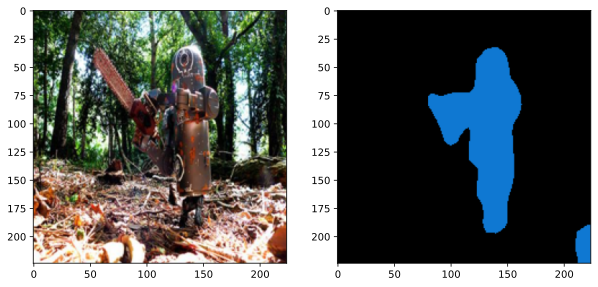

In [91]:
# create a color pallette, selecting a color for each class
palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
colors = (colors % 255).numpy().astype("uint8")

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
# plot the semantic segmentation predictions of 21 classes in each color
segmentation_image = Image.fromarray(segmentation_mask.byte().cpu().numpy()).resize((224, 224))
segmentation_image.putpalette(colors)

axes[0].imshow(Image.fromarray(np.array(data, dtype=np.uint8).reshape(224, 224, 3)))
axes[1].imshow(segmentation_image)
plt.show()

Using this approach, inference can be performed on endpoint workers of any nature; for example, one can make HTTP requests to a model server (vLLM), use other endpoint inference services (Triton), or even execute native code:

![](https://github.com/NVIDIA/spark-rapids-examples/raw/main/examples/ML%2BDL-Examples/Spark-DL/dl_inference/images/spark-server.png)

More examples of what can be wrapped in the Spark UDF API with GPU support can be found in the [Spark Rapids](https://github.com/NVIDIA/spark-rapids-examples) library (developed by Nvidia). This extension, among other things, can modify the SQL backend and the Catalyst optimizer to use GPU operations natively through Spark. Such low-level optimization allows for achieving acceleration for many operations, including for third-party libraries like [XGBoost on Spark](https://xgboost.readthedocs.io/en/stable/tutorials/spark_estimator.html).

![](https://github.com/NVIDIA/spark-rapids-examples/raw/main/docs/img/guides/mortgage-perf.png)

### `Distributed Torch`

Now let's look at distributed training. Spark acts as a resource manager, while the entire interface uses the standard APIs of the language.

![](https://developer-blogs.nvidia.com/wp-content/uploads/2023/06/distributed-training-torchdistributor-api-diagram.png)

It is claimed that Spark is effective as a resource manager; however, the final choice will likely be determined by the system that is already configured.

![](https://www.databricks.com/sites/default/files/inline-images/db-554-blog-img-4.png)

In [1]:
import numpy as np

import torch
import torchvision
from torchvision.utils import save_image

class ConvolutionalVAE(torch.nn.Module):
    def __init__(self, latent_dim, kl_coef):
        super().__init__()

        self.kl_coef = kl_coef

        # Encoder
        self.encoder = torch.nn.Sequential(
            torch.nn.Conv2d(1, 4, kernel_size=2, stride=2, padding=1),
            torch.nn.ReLU(),
            torch.nn.Conv2d(4, 8, kernel_size=2, stride=2, padding=1),
            torch.nn.ReLU(),
            torch.nn.Conv2d(8, 16, kernel_size=2, stride=2, padding=1),
            torch.nn.ReLU(),
            torch.nn.Flatten(),
        )

        self.hidden_size = [16, 5, 5]
        self.fc_mu = torch.nn.Linear(np.prod(self.hidden_size), latent_dim)
        self.fc_log_var = torch.nn.Linear(np.prod(self.hidden_size), latent_dim)

        # Decoder
        self.decoder_fc = torch.nn.Linear(latent_dim, np.prod(self.hidden_size))
        self.decoder = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(16, 8, kernel_size=2, stride=2, padding=1),
            torch.nn.ReLU(),
            torch.nn.ConvTranspose2d(8, 4, kernel_size=2, stride=2, padding=1),
            torch.nn.ReLU(),
            torch.nn.ConvTranspose2d(4, 1, kernel_size=2, stride=2),
            torch.nn.Sigmoid()
        )

    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        h = self.encoder(x)
        mu, log_var = self.fc_mu(h), self.fc_log_var(h)
        z = self.reparameterize(mu, log_var)
        z = self.decoder_fc(z)
        z = z.view(-1, *self.hidden_size)
        return self.decoder(z), mu, log_var

    def loss_function(self, recon_x, x, mu, log_var):
        BCE = torch.nn.functional.mse_loss(recon_x, x, reduction='mean')
        KLD = -0.5 * (1 + log_var - mu.pow(2) - log_var.exp()).sum(dim=-1)
        return BCE + self.kl_coef * KLD

def train_epoch(model, dataloader, optimizer, device):
    losses = []
    for i, (images, _) in enumerate(dataloader):
        images = images.to(device)

        # Forward pass
        recon_images, mu, log_var = model(images)
        loss = model.module.loss_function(recon_images, images, mu, log_var).mean()

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        losses.append(loss.item())

    return np.mean(losses)

@torch.no_grad()
def validate(model, dataloader, device, epoch, n_images):
    model = model.module

    test_images, _ = next(iter(dataloader))
    recon_images, _, _ = model(test_images.to(device))

    zs = torch.randn(n_images, model.fc_mu.out_features, device=device)
    zs = model.decoder_fc(zs)
    zs = zs.view(-1, *model.hidden_size)
    gen_images = model.decoder(zs)

    comparison = torch.cat([test_images[:n_images], recon_images[:n_images].view(n_images, 1, 28, 28).cpu(), gen_images.cpu()])
    save_image(comparison.cpu(), f'./vae/validation_{epoch+1}.png', nrow=8)

In [2]:
def train(num_epochs, batch_size, lr, kl_coef):
    import torch
    import torch.distributed as dist
    from torch.nn.parallel import DistributedDataParallel as DDP
    from torch.utils.data import DistributedSampler, DataLoader

    local_rank, global_rank, world_size = int(os.environ["LOCAL_RANK"]), int(os.environ["RANK"]), int(os.environ['WORLD_SIZE'])
    print(f'Local Rank: {local_rank}, Global rank: {global_rank}, World size: {world_size}')

    dist.init_process_group("nccl")

    train_dataset = torchvision.datasets.MNIST(root='~/.cache', train=True, download=True, transform=torchvision.transforms.ToTensor())
    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, sampler=DistributedSampler(train_dataset, shuffle=True))

    device = torch.device("cuda", index=local_rank)
    model = DDP(ConvolutionalVAE(latent_dim=128, kl_coef=kl_coef).to(device))
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Training Loop
    for epoch in range(num_epochs):
        mean_loss = train_epoch(model, train_loader, optimizer, device)
        print(f'Epoch {epoch + 1}/{num_epochs}: {mean_loss:.3f}')

        if (epoch + 1) % 2 == 0 and local_rank == 0:
            validate(model, train_loader, device, epoch=epoch + 1, n_images=8)

    dist.destroy_process_group()

In [5]:
from pyspark.sql import SparkSession
from pyspark import SparkConf, SparkContext

conf = (
    SparkConf()
        .set('spark.ui.port', '4050')
        .set('spark.driver.memory', '15g')
        .set('spark.python.worker.reuse', 'true')

        # GPU configuration
        .set('spark.driver.resource.gpu.discoveryScript', '/mnt/c/Users/nahod/Documents/CodeBlocks/MSU/Hadoop/Industrial-Machine-Learning-on-Hadoop-and-Spark/Seminars/Seminar 09/getGPUResources.sh')
        .set('spark.executor.resource.gpu.discoveryScript', '/mnt/c/Users/nahod/Documents/CodeBlocks/MSU/Hadoop/Industrial-Machine-Learning-on-Hadoop-and-Spark/Seminars/Seminar 09/getGPUResources.sh')

        .set("spark.task.resource.gpu.amount", "1")
        .set("spark.driver.resource.gpu.amount", "1")
        .set("spark.executor.resource.gpu.amount", "1")

        .setMaster('local[*]')
)
sc = SparkContext(conf=conf)
spark = SparkSession(sc)

25/11/24 21:26:37 WARN Utils: Your hostname, DESKTOP-8FB26C5 resolves to a loopback address: 127.0.1.1; using 172.29.27.85 instead (on interface eth0)
25/11/24 21:26:37 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/11/24 21:26:38 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
25/11/24 21:26:39 WARN ResourceUtils: The configuration of cores (exec = 16 task = 1, runnable tasks = 16) will result in wasted resources due to resource gpu limiting the number of runnable tasks per executor to: 1. Please adjust your configuration.


In [6]:
from pyspark.ml.torch.distributor import TorchDistributor

distributor = TorchDistributor(num_processes=1, local_mode=True, use_gpu=True)
distributor.run(train, 11, 128, 1e-3, 1e-3)

Started local training with 1 processes


Local Rank: 0, Global rank: 0, World size: 1
Epoch 1/11: 0.085
Epoch 2/11: 0.067
Epoch 3/11: 0.062
Epoch 4/11: 0.057
Epoch 5/11: 0.053
Epoch 6/11: 0.049
Epoch 7/11: 0.047
Epoch 8/11: 0.045
Epoch 9/11: 0.044
Epoch 10/11: 0.044
Epoch 11/11: 0.043


Finished local training with 1 processes
